In [1]:
!pip install wandb pyyaml opencv-python;

  Using cached wandb-0.19.11-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (10 kB)
  Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached docker_pycreds-0.4.0-py2.py3-none-any.whl.metadata (1.8 kB)
  Using cached setproctitle-1.3.6-cp312-cp312-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (10 kB)
Using cached wandb-0.19.11-py3-none-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (21.4 MB)
Using cached opencv_python-4.11.0.86-cp37-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (63.0 MB)
Using cached docker_pycreds-0.4.0-py2.py3-none-any.whl (9.0 kB)
Using cached setproctitle-1.3.6-cp312-cp312-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (31 kB)


In [2]:
import os
import yaml
import glob
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
import wandb
from wandb.integration.keras import WandbCallback
import matplotlib.pyplot as plt

2025-05-21 11:35:31.138758: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-21 11:35:31.234668: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-21 11:35:31.261276: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-21 11:35:31.438911: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-21 11:35:32.632811: W tensorflow/compiler/tf2

In [3]:
wandb.login(key="017feefe0af6702cda76aab121ec71cf3a362fec")

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/jovyan/.netrc
wandb: Currently logged in as: samutheman (rueedi-tobias-hochschule-luzern) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [4]:
dataset_yaml = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/data.yaml"
images_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/train"
labels_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/train"
images_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/val"
labels_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/val"
images_testset = False#"/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/test"
labels_testset = False#"/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/test"


In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

In [6]:
with open(dataset_yaml, "r") as f:
    config = yaml.safe_load(f)


In [7]:
# --- Parameters (tweak these to your dataset) ---
IMG_SIZE    = 516
GRID_SIZE   = 8
NUM_CLASSES = 1   #
NUM_BOXES   = 1    # number of anchors per cell
OUTPUT_SHAPE = (GRID_SIZE, GRID_SIZE, NUM_BOXES * (5 + NUM_CLASSES))

In [8]:
def build_yolo_model(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = tf.keras.Input(shape=input_shape)
    def conv_bn_leaky(x, filters):
        x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        return layers.LeakyReLU(alpha=0.1)(x)

    x = conv_bn_leaky(inputs, 16)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 32)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 64)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 128)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 256)
    #x = layers.MaxPool2D(2)(x)
    #x = conv_bn_leaky(x, 256)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 512)
    x = layers.MaxPool2D(2)(x)
    x = conv_bn_leaky(x, 512)

    # prediction layer
    x = layers.Conv2D(
        NUM_BOXES * (5 + NUM_CLASSES),
        kernel_size=1,
        padding='same',
        activation='sigmoid'
    )(x)
    output = layers.Reshape((GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))(x)

    return tf.keras.Model(inputs, output)

In [9]:
# --- YOLO loss with binary class ---
def yolo_loss(y_true, y_pred):
    # reshape to (..., S, S, B, 5 + C)
    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    obj_mask = true[..., 4:5]

    # localization losses
    xy_loss = tf.reduce_sum(obj_mask * tf.square(true[..., 0:2] - pred[..., 0:2]))
    wh_loss = tf.reduce_sum(obj_mask * tf.square(
        tf.sqrt(true[..., 2:4] + 1e-6) - tf.sqrt(pred[..., 2:4] + 1e-6)
    ))

    # objectness and class losses
    obj_loss = tf.reduce_sum(
        tf.keras.losses.binary_crossentropy(true[..., 4:5], pred[..., 4:5])
    )
    class_bce = tf.keras.losses.binary_crossentropy(true[..., 5:], pred[..., 5:])
    class_bce = tf.expand_dims(class_bce, axis=-1)
    class_loss = tf.reduce_sum(obj_mask * class_bce)

    return xy_loss + wh_loss + obj_loss + class_loss

In [10]:
def area_difference_loss(y_true, y_pred):
    # Reshape to (..., S, S, B, 5 + C)
    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))

    # Calculate area = w * h * objectness
    pred_area = pred[..., 2] * pred[..., 3] * pred[..., 4]
    true_area = true[..., 2] * true[..., 3] * true[..., 4]

    # Sum all areas in the batch
    total_pred_area = tf.reduce_sum(pred_area)
    total_true_area = tf.reduce_sum(true_area)

    # Loss is the absolute difference in total area
    return tf.abs(total_pred_area - total_true_area)

In [11]:
def combined_yolo_area_loss(y_true, y_pred, area_weight=0.1):
    # Standard YOLO loss
    yolo = yolo_loss(y_true, y_pred)
    # Area difference loss
    area = area_difference_loss(y_true, y_pred)
    # Combine with weighting
    return yolo + area_weight * area

In [12]:
def build_yolo_label_grid(label_path, grid_size, num_classes):
    label_grid = np.zeros((grid_size, grid_size, 5 + num_classes), dtype=np.float32)

    if not os.path.exists(label_path):
        return label_grid

    with open(label_path, "r") as f:
        for line in f:
            class_id, x, y, w, h = map(float, line.strip().split())
            gx = min(int(x * grid_size), grid_size - 1)
            gy = min(int(y * grid_size), grid_size - 1)
            cell_x = x * grid_size - gx
            cell_y = y * grid_size - gy
            label_grid[gy, gx, 0:5] = [cell_x, cell_y, w, h, 1.0]
            label_grid[gy, gx, 5 + int(class_id)] = 1.0

    return label_grid

def prepare_image_label_paths(image_dir, label_dir, grid_size, num_classes):
    image_paths = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
    label_grids = []

    for img_path in image_paths:
        filename = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(label_dir, f"{filename}.txt")
        label_grid = build_yolo_label_grid(label_path, grid_size, num_classes)
        label_grids.append(label_grid)

    return image_paths, np.array(label_grids, dtype=np.float32)


In [13]:
def parse_image_and_label(image_path, label_tensor, img_size):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [img_size, img_size])
    img = img / 255.0
    return img, label_tensor

def make_yolo_dataset(image_paths, label_tensors, img_size, batch_size=4, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((image_paths, label_tensors))
    if shuffle:
        ds = ds.shuffle(buffer_size=len(image_paths))
    ds = ds.map(lambda p, l: parse_image_and_label(p, l, img_size),
                num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

In [14]:
train_image_paths, train_labels = prepare_image_label_paths(images_trainset, labels_trainset, GRID_SIZE, NUM_CLASSES)
val_image_paths,   val_labels   = prepare_image_label_paths(images_valset,   labels_valset,   GRID_SIZE, NUM_CLASSES)

In [15]:
train_ds = make_yolo_dataset(train_image_paths, train_labels, IMG_SIZE, batch_size=4)
val_ds   = make_yolo_dataset(val_image_paths,   val_labels,   IMG_SIZE, batch_size=4, shuffle=False)

2025-05-21 11:35:39.428304: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13294 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:e8:00.0, compute capability: 8.6


In [16]:
x_train = np.array(x_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)
x_val   = np.array(x_val,   dtype=np.float32)
y_val   = np.array(y_val,   dtype=np.float32)

NameError: name 'x_train' is not defined

In [17]:
wandb.init(project="Own CNN", name="CNNModel", config=config)

In [18]:
print("x_train type:", type(x_train))
print("x_train shape:", getattr(x_train, 'shape', 'No shape'))
print("y_train shape:", getattr(y_train, 'shape', 'No shape'))
#print("First element:", x_train[0])
#print("First element ", x_train[0])

NameError: name 'x_train' is not defined

In [19]:
model = build_yolo_model()
model.compile(optimizer='adam', loss=combined_yolo_area_loss)
model.summary()

/opt/conda/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 516, 516, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 516, 516, 16)   │           432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 516, 516, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 516, 516, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 258, 258, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 258, 258, 32)   │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 258, 258, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 258, 258, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 129, 129, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 129, 129, 64)   │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 129, 129, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 129, 129, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 16, 16, 512)    │     1,179,648 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 3,940,214 (15.03 MB)

 Trainable params: 3,937,174 (15.02 MB)

 Non-trainable params: 3,040 (11.88 KB)

In [20]:
train_ds = (
    tf.data.Dataset
      .from_tensor_slices((x_train, y_train))
      .shuffle(1024)
      .batch(batch_size)
      .prefetch(tf.data.AUTOTUNE)
)

val_ds = (
    tf.data.Dataset
      .from_tensor_slices((x_val, y_val))
      .batch(batch_size)
      .prefetch(tf.data.AUTOTUNE)
)

NameError: name 'x_train' is not defined

In [21]:
batch_size = 8  # try smaller if still OOM

model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[WandbCallback(save_graph=False, save_model=False)]
)

wandb: WARNING WandbCallback is deprecated and will be removed in a future release. Please use the WandbMetricsLogger, WandbModelCheckpoint, and WandbEvalCallback callbacks instead. See https://docs.wandb.ai/guides/integrations/keras for more information.


Epoch 1/10


I0000 00:00:1747827378.969096     680 service.cc:146] XLA service 0x7f0d00208f80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747827378.969244     680 service.cc:154]   StreamExecutor device (0): NVIDIA A16, Compute Capability 8.6
2025-05-21 11:36:19.158375: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-21 11:36:19.550848: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-05-21 11:36:30.482642: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:762] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


   3/2715 ━━━━━━━━━━━━━━━━━━━━ 1:58 44ms/step - loss: 427.4335   

I0000 00:00:1747827392.124566     680 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2715/2715 ━━━━━━━━━━━━━━━━━━━━ 143s 47ms/step - loss: 82.6277 - val_loss: 60.7419
Epoch 2/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 113s 42ms/step - loss: 58.5996 - val_loss: 59.9275
Epoch 3/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 113s 42ms/step - loss: 52.0839 - val_loss: 56.4537
Epoch 4/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 113s 42ms/step - loss: 48.0316 - val_loss: 47.8168
Epoch 5/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 113s 42ms/step - loss: 45.5739 - val_loss: 70.8217
Epoch 6/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 114s 42ms/step - loss: 42.8562 - val_loss: 46.1145
Epoch 7/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 114s 42ms/step - loss: 38.6891 - val_loss: 46.2174
Epoch 8/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 114s 42ms/step - loss: 35.2229 - val_loss: 50.9300
Epoch 9/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 114s 42ms/step - loss: 30.2821 - val_loss: 54.7893
Epoch 10/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 114s 42ms/step - loss: 24.8750 - val_loss: 64.5289


In [22]:
def draw_boxes(image, label_grid, pred_grid, conf_thresh=0.5):
    pred_grid = np.squeeze(pred_grid, axis=2)  # (4,4,1,6) -> (4,4,6)

    img = (image * 255).astype(np.uint8).copy()
    h, w, _ = img.shape
    cell_h, cell_w = h // GRID_SIZE, w // GRID_SIZE

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            if label_grid[gy, gx, 4] > 0.5:
                x, y, bw, bh = label_grid[gy, gx, :4]
                cx = int((gx + x) * cell_w)
                cy = int((gy + y) * cell_h)
                bw = int(bw * w)
                bh = int(bh * h)
                cv2.rectangle(img, (cx - bw//2, cy - bh//2), (cx + bw//2, cy + bh//2), (0, 255, 0), 2)

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            if pred_grid[gy, gx, 4] > conf_thresh:
                x, y, bw, bh = pred_grid[gy, gx, :4]
                cx = int((gx + x) * cell_w)
                cy = int((gy + y) * cell_h)
                bw = int(bw * w)
                bh = int(bh * h)
                cv2.rectangle(img, (cx - bw//2, cy - bh//2), (cx + bw//2, cy + bh//2), (255, 0, 0), 2)

    return img

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


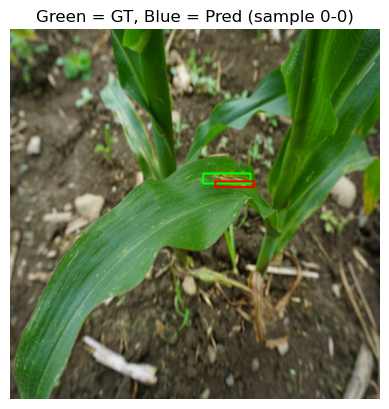

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


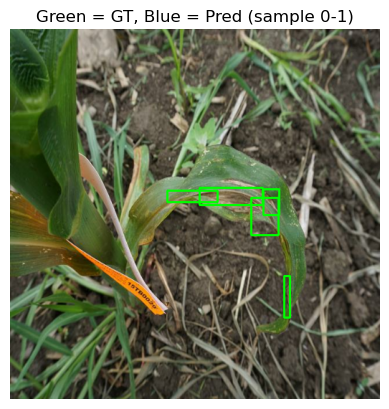

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


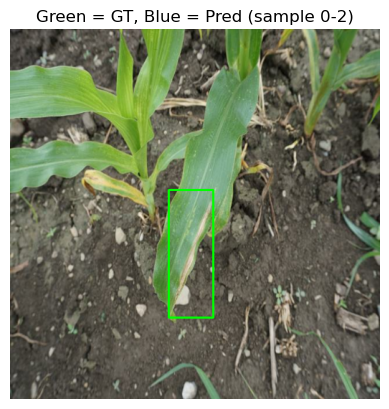

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


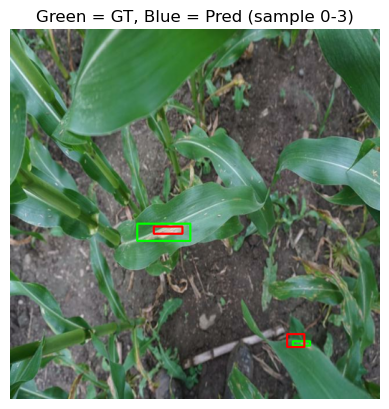

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


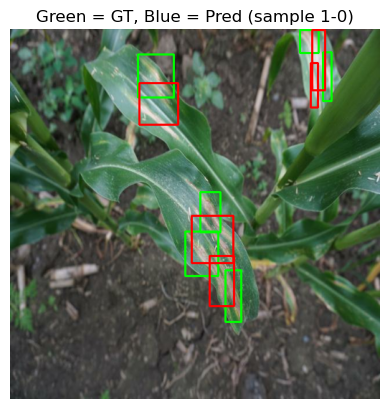

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


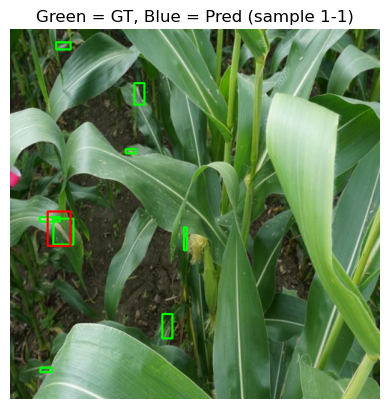

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


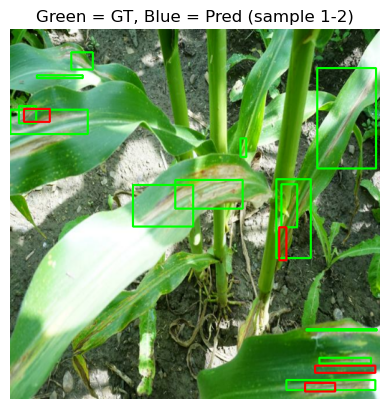

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


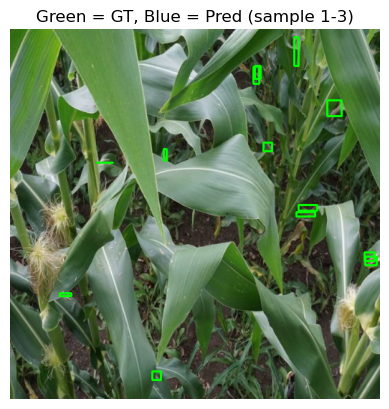

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


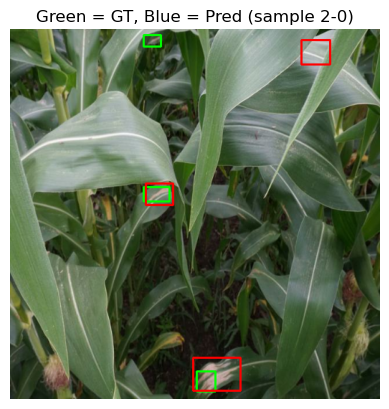

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


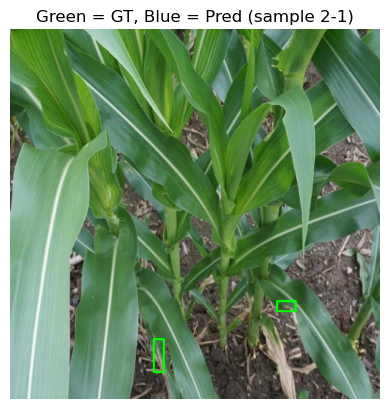

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


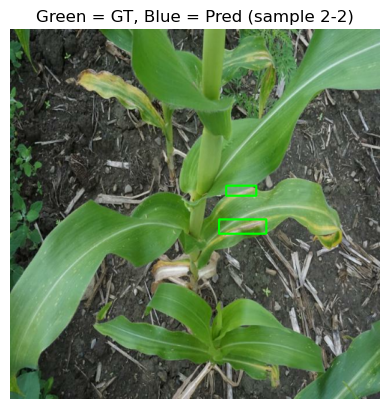

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


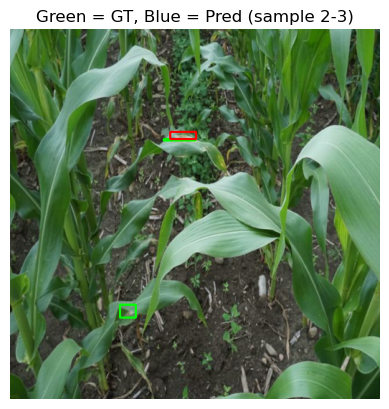

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


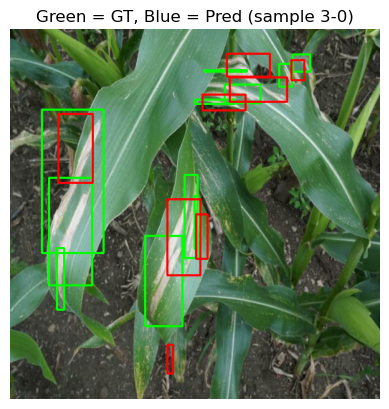

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


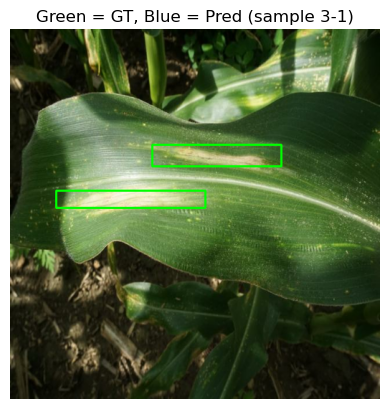

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


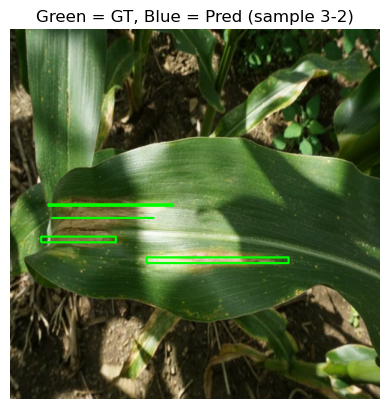

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


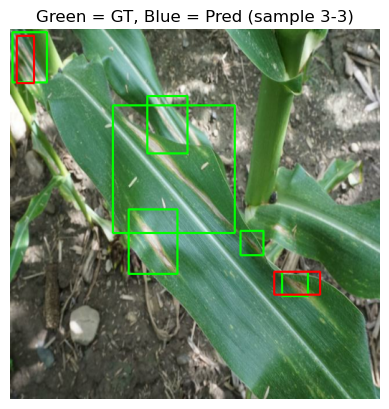

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


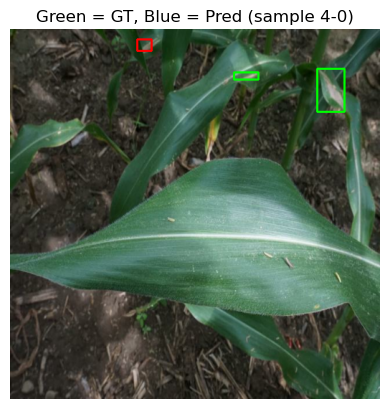

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


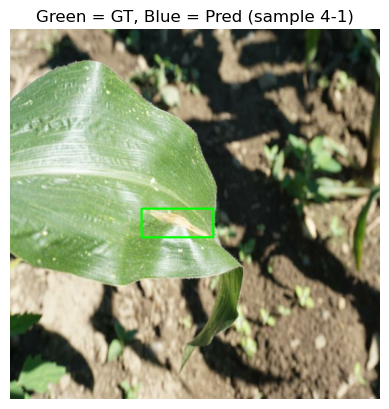

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


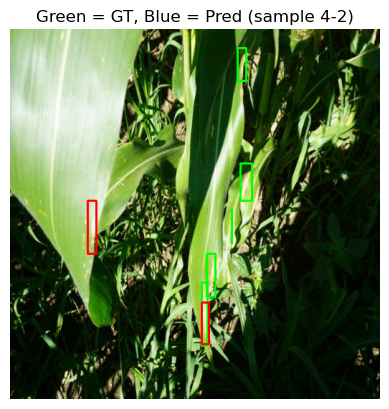

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


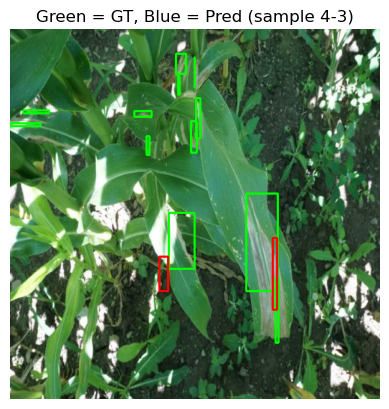

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


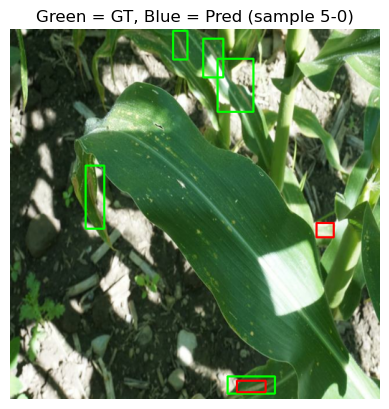

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


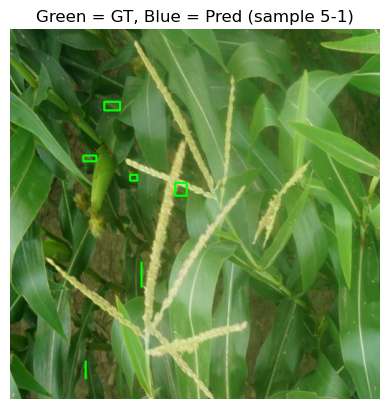

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


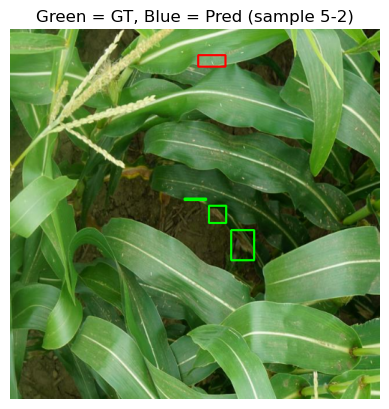

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


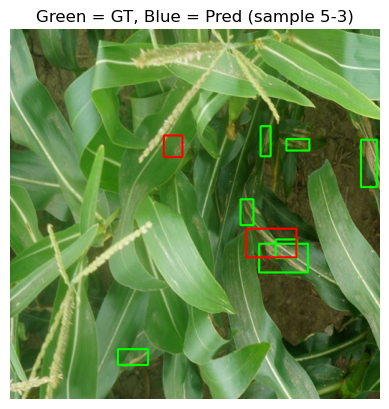

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


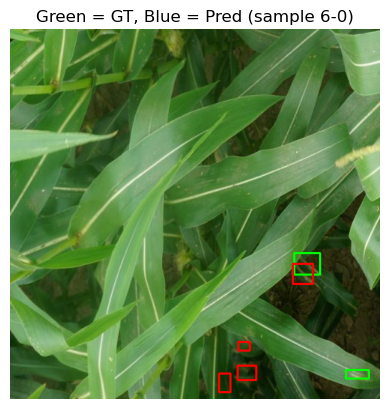

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


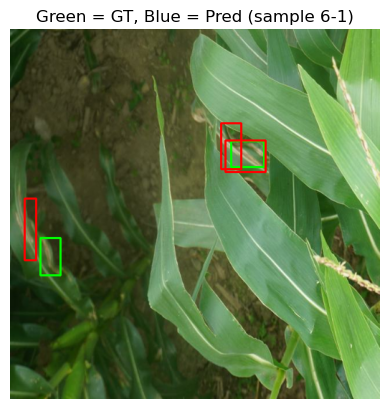

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


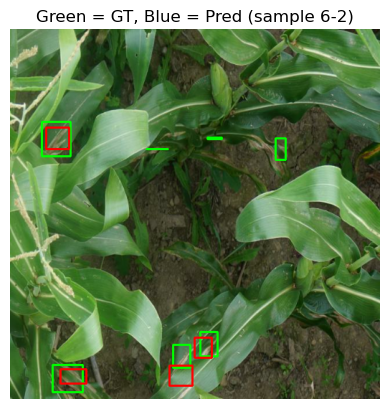

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


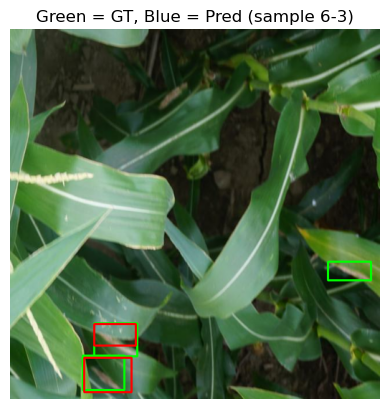

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


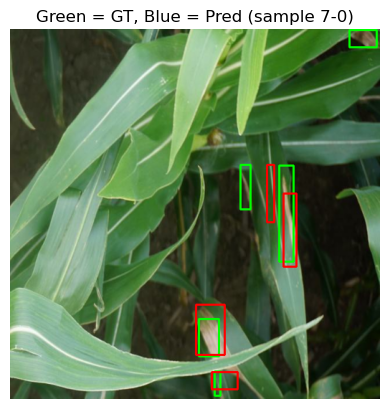

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


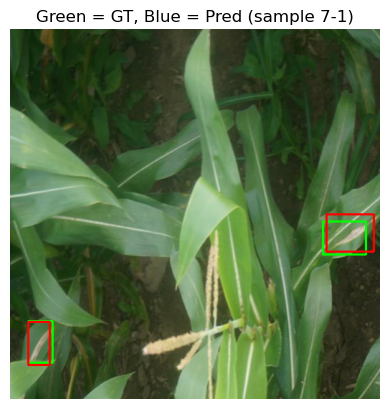

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


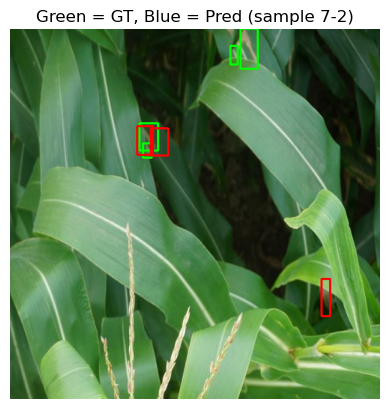

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


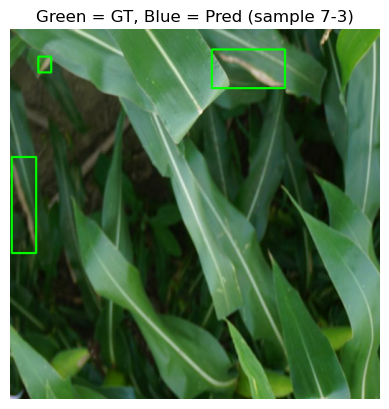

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


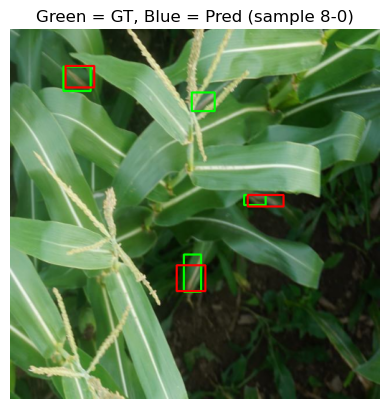

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


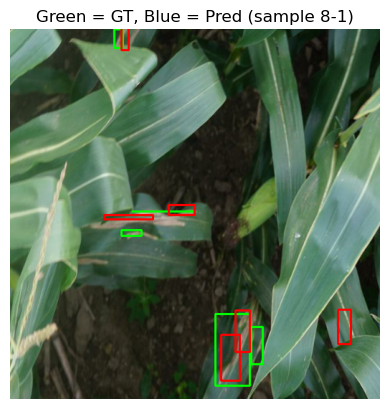

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


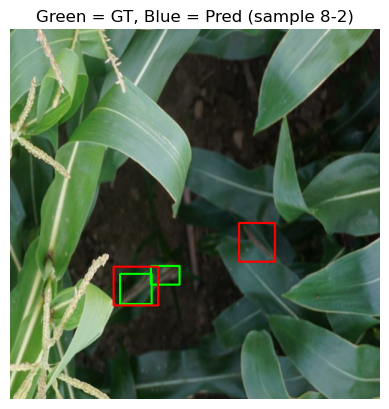

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


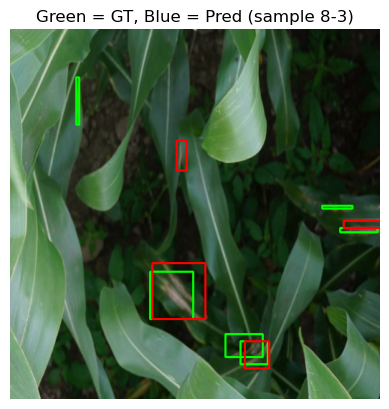

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


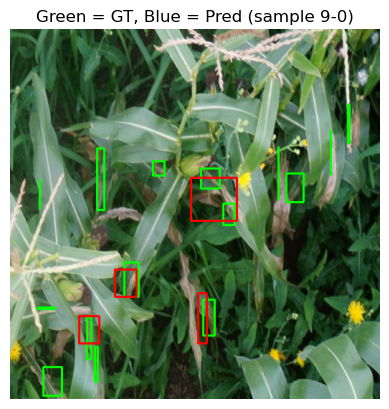

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


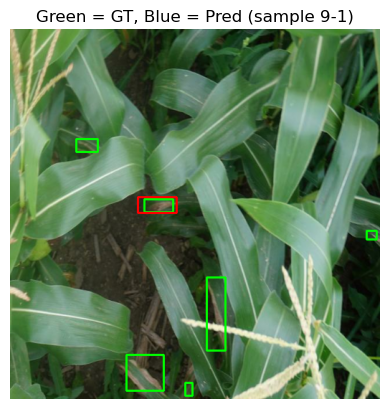

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


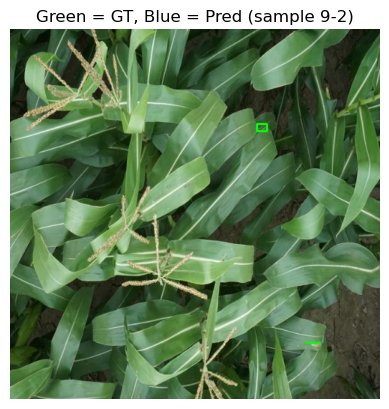

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


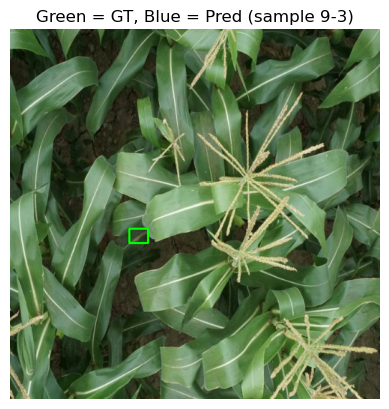

2025-05-21 11:58:44.587528: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [23]:
# Visualize predictions from tf.data.Dataset
for i, (image_tensor, label_tensor) in enumerate(val_ds.take(10)):
    image = image_tensor.numpy()         # shape (B, H, W, 3)
    label = label_tensor.numpy()         # shape (B, 4, 4, 6)

    for b in range(image.shape[0]):      # batch loop
        img_np = image[b]
        label_np = label[b]
        pred = model.predict(img_np[np.newaxis])[0]  # (4,4,1,6)

        vis_img = draw_boxes(img_np, label_np, pred)

        plt.imshow(vis_img)
        plt.axis('off')
        plt.title(f"Green = GT, Blue = Pred (sample {i}-{b})")
        plt.show()